<a href="https://colab.research.google.com/github/arionpap4/base/blob/master/Facial_expression_classification_with_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
%cd /content/drive/MyDrive/Önlab
#%cp /content/drive/MyDrive/archive.zip 2023 1/fer2013/archive.zip" .

/content/drive/MyDrive/Önlab


In [5]:
import numpy as np
import pandas as pd
import os
from glob import glob

from sklearn.metrics import classification_report
import seaborn as sn
from sklearn.model_selection import train_test_split

sn.set(font_scale=1.4)
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import cv2
import dlib
import tensorflow as tf
from tqdm import tqdm

import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random

from tensorflow.keras.applications.resnet50 import preprocess_input
from google.colab.patches import cv2_imshow
from sklearn.model_selection import train_test_split

##EMOTIC DATASET LOADER

In [6]:
!unzip /content/drive/MyDrive/Önlab/aligned.zip -d /content/tempfolder

Streaming output truncated to the last 5000 lines.
  inflating: /content/tempfolder/aligned/train_07272_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07273_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07274_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07275_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07276_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07277_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07278_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07279_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07280_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07281_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07282_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07283_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07284_aligned.jpg  
  inflating: /content/tempfolder/aligned/train_07285_aligned.jpg  
  inflating

In [7]:
# Képek könyvtára
image_directory = '/content/tempfolder/aligned'
# Cél mappák
train_directory = '/content/tempfolder/aligned/train'
test_directory = '/content/tempfolder/aligned/test'
val_directory = '/content/tempfolder/aligned/val'

# Létrehozzuk a célmappákat, ha nem léteznek
os.makedirs(train_directory, exist_ok=True)
os.makedirs(test_directory, exist_ok=True)
os.makedirs(val_directory, exist_ok=True)

# Betöltjük a label fájlt
label_file = '/content/drive/MyDrive/Önlab/list_patition_label.txt'

# Címkék szótára
class_labels = {
    1: 'Surprise',
    2: 'Fear',
    3: 'Disgust',
    4: 'Happiness',
    5: 'Sadness',
    6: 'Anger',
    7: 'Neutral'
}

# Képek és címkék párosítása a label fájl alapján
image_labels = {}
with open(label_file, 'r') as file:
    labels = file.readlines()
for label in labels:
    parts = label.strip().split()
    image_name = parts[0].split('.')[0] + '_aligned.jpg'  # Az 'aligned' rész hozzáadása a képnevhez
    image_labels[image_name] = int(parts[1])
print(image_labels)

# Képek másolása a megfelelő mappába a címkék alapján
for file_name in os.listdir(image_directory):
    image_path = os.path.join(image_directory, file_name)
    if file_name.endswith('.jpg'):
        image_name = file_name.split('.')[0]  # Fájlkiterjesztés nélkül
        class_index = image_labels[file_name]
        destination = os.path.join(train_directory if file_name.startswith('train') else test_directory, class_labels[class_index])
        os.makedirs(destination, exist_ok=True)
        destination_path = os.path.join(destination, file_name)
        shutil.copy(image_path, destination_path)

# Cél mappák létrehozása a validációs mappában
for class_index in class_labels.keys():
    class_directory = os.path.join(val_directory, class_labels[class_index])
    os.makedirs(class_directory, exist_ok=True)

# Train és validation adatok készítése
train_files = []
val_files = []
for root, dirs, files in os.walk(train_directory):
    for file in files:
        if file.endswith('.jpg'):
            train_files.append(os.path.join(root, file))

# Az adatok véletlenszerű megkeverése
train_files, val_files = train_test_split(train_files, test_size=0.2, random_state=42)
for file_name in val_files:
    image_path = os.path.join(train_directory, file_name)
    destination_path = image_path.replace(train_directory, val_directory)
    shutil.move(image_path, destination_path)

{'train_00001_aligned.jpg': 5, 'train_00002_aligned.jpg': 5, 'train_00003_aligned.jpg': 4, 'train_00004_aligned.jpg': 4, 'train_00005_aligned.jpg': 5, 'train_00006_aligned.jpg': 1, 'train_00007_aligned.jpg': 5, 'train_00008_aligned.jpg': 4, 'train_00009_aligned.jpg': 4, 'train_00010_aligned.jpg': 1, 'train_00011_aligned.jpg': 4, 'train_00012_aligned.jpg': 1, 'train_00013_aligned.jpg': 1, 'train_00014_aligned.jpg': 4, 'train_00015_aligned.jpg': 5, 'train_00016_aligned.jpg': 4, 'train_00017_aligned.jpg': 4, 'train_00018_aligned.jpg': 4, 'train_00019_aligned.jpg': 4, 'train_00020_aligned.jpg': 4, 'train_00021_aligned.jpg': 4, 'train_00022_aligned.jpg': 4, 'train_00023_aligned.jpg': 6, 'train_00024_aligned.jpg': 5, 'train_00025_aligned.jpg': 5, 'train_00026_aligned.jpg': 5, 'train_00027_aligned.jpg': 2, 'train_00028_aligned.jpg': 5, 'train_00029_aligned.jpg': 4, 'train_00030_aligned.jpg': 5, 'train_00031_aligned.jpg': 3, 'train_00032_aligned.jpg': 1, 'train_00033_aligned.jpg': 5, 'train_00

## Limitalt szamu - SKIP



In [ ]:
# Korábbi próbálkozás, amelynél csak limitált számú elemeket próbáltunk nézni. Nem szükséges futtatni.
#limitált számú elemekre osztás
n=50

# Iterálás a train_directory almappáin
for class_label in os.listdir(train_directory):
    class_directory = os.path.join(train_directory, class_label)
    if os.path.isdir(class_directory):
        image_files = os.listdir(class_directory)
        if len(image_files) > n:
            # Felesleges képek véletlenszerű kiválasztása
            excess_files = random.sample(image_files, len(image_files) - n)
            for excess_file in excess_files:
                excess_file_path = os.path.join(class_directory, excess_file)
                os.remove(excess_file_path)

# Iterálás a train_directory almappáin
for class_label in os.listdir(test_directory):
    class_directory = os.path.join(test_directory, class_label)
    if os.path.isdir(class_directory):
        image_files = os.listdir(class_directory)
        if len(image_files) > n:
            # Felesleges képek véletlenszerű kiválasztása
            excess_files = random.sample(image_files, len(image_files) - n)
            for excess_file in excess_files:
                excess_file_path = os.path.join(class_directory, excess_file)
                os.remove(excess_file_path)

# Iterálás a train_directory almappáin
for class_label in os.listdir(val_directory):
    class_directory = os.path.join(val_directory, class_label)
    if os.path.isdir(class_directory):
        image_files = os.listdir(class_directory)
        if len(image_files) > n:
            # Felesleges képek véletlenszerű kiválasztása
            excess_files = random.sample(image_files, len(image_files) - n)
            for excess_file in excess_files:
                excess_file_path = os.path.join(class_directory, excess_file)
                os.remove(excess_file_path)


## ImageDataGenerator

In [8]:
# Az ImageDataGenerator objektum létrehozása és konfigurálása az augmentációs beállításokkal
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True
)

normal_gen = ImageDataGenerator(rescale=1./255
                                )

# preprocessing_function=preprocess_input


# Képek augmentálása (opcionális)
train_generator = datagen.flow_from_directory(
    train_directory,
    target_size=(100, 100),
    batch_size=32,
    class_mode='sparse'
)
val_generator = normal_gen.flow_from_directory(
    val_directory,
    target_size=(100, 100),
    batch_size=32,
    class_mode='sparse'
)
test_generator = normal_gen.flow_from_directory(
    test_directory,
    target_size=(100, 100),
    batch_size=32,
    class_mode='sparse',
    shuffle=False
)


Found 9816 images belonging to 7 classes.
Found 2455 images belonging to 7 classes.
Found 3068 images belonging to 7 classes.


##REVIEW OF THE CLASSES

TRAIN
_______________
Disgust
568
Sadness
1569
Happiness
3833
Surprise
1010
Anger
569
Fear
219
Neutral
2048


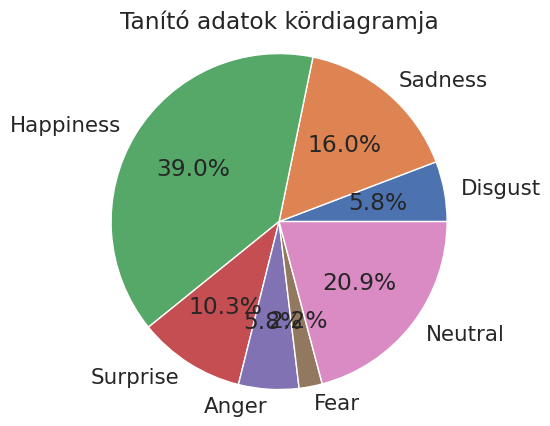

_______________
TEST
_______________
Disgust
160
Sadness
478
Happiness
1185
Surprise
329
Anger
162
Fear
74
Neutral
680


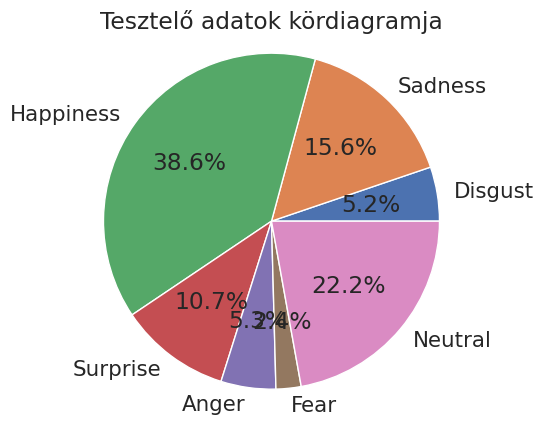

_______________
VALID
_______________
Disgust
149
Sadness
413
Happiness
939
Surprise
280
Anger
136
Fear
62
Neutral
476


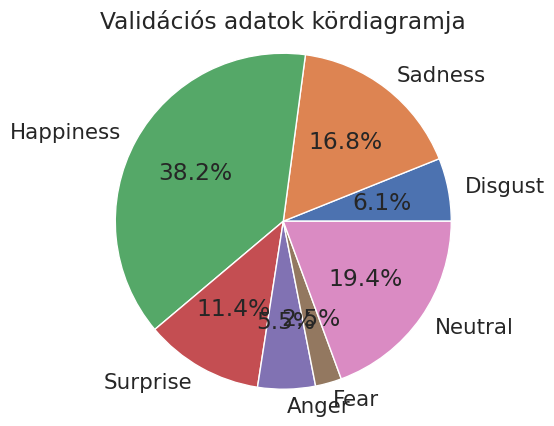

In [ ]:
import os
import numpy as np
from sklearn.utils import compute_class_weight


# Gyűjtsd össze a címkéket és számold meg a darabszámukat az egyes mappákból
cimkek = []
mappa_nevek = []
mappa_darabszamok = []
class_weights = []
osszes=0

print("TRAIN")
print("_______________")
for mappa in os.listdir(train_directory):
    mappa_path = os.path.join(train_directory, mappa)
    mappa_darabszam = len(os.listdir(mappa_path))
    mappa_darabszamok.append(mappa_darabszam)
    cimkek.extend([mappa] * mappa_darabszam)
    mappa_nevek.append(mappa)
    osszes+=mappa_darabszam
    print(mappa)
    print(mappa_darabszam)

plt.pie(mappa_darabszamok, labels=mappa_nevek, autopct='%1.1f%%')
plt.axis('equal')

plt.title("Tanító adatok kördiagramja")
plt.show()


cimkek = []
mappa_nevek = []
mappa_darabszamok = []
class_weights = []
osszes=0

print("_______________")
print("TEST")
print("_______________")
for mappa in os.listdir(test_directory):
    mappa_path = os.path.join(test_directory, mappa)
    mappa_darabszam = len(os.listdir(mappa_path))
    mappa_darabszamok.append(mappa_darabszam)
    cimkek.extend([mappa] * mappa_darabszam)
    mappa_nevek.append(mappa)
    osszes+=mappa_darabszam
    print(mappa)
    print(mappa_darabszam)

plt.pie(mappa_darabszamok, labels=mappa_nevek, autopct='%1.1f%%')
plt.axis('equal')

plt.title("Tesztelő adatok kördiagramja")
plt.show()


cimkek = []
mappa_nevek = []
mappa_darabszamok = []
class_weights = []
osszes=0

print("_______________")
print("VALID")
print("_______________")
for mappa in os.listdir(val_directory):
    mappa_path = os.path.join(val_directory, mappa)
    mappa_darabszam = len(os.listdir(mappa_path))
    mappa_darabszamok.append(mappa_darabszam)
    cimkek.extend([mappa] * mappa_darabszam)
    mappa_nevek.append(mappa)
    osszes+=mappa_darabszam
    print(mappa)
    print(mappa_darabszam)


plt.pie(mappa_darabszamok, labels=mappa_nevek, autopct='%1.1f%%')
plt.axis('equal')

plt.title("Validációs adatok kördiagramja")
plt.show()



## 5x5-ös táblázat

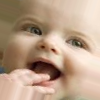

3


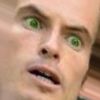

6


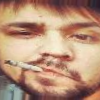

1


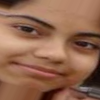

3


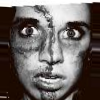

2


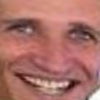

3


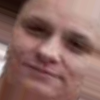

3


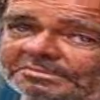

5


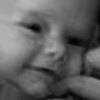

3


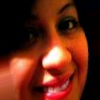

3


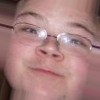

3


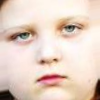

4


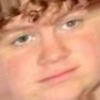

4


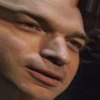

3


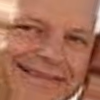

3


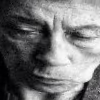

5


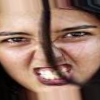

0


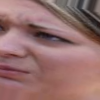

5


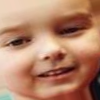

3


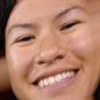

3


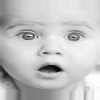

6


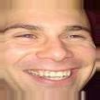

3


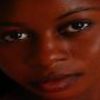

4


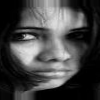

5


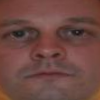

4


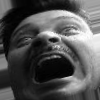

2


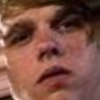

4


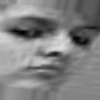

1


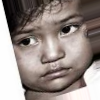

5


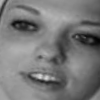

3


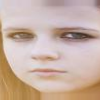

4


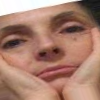

5


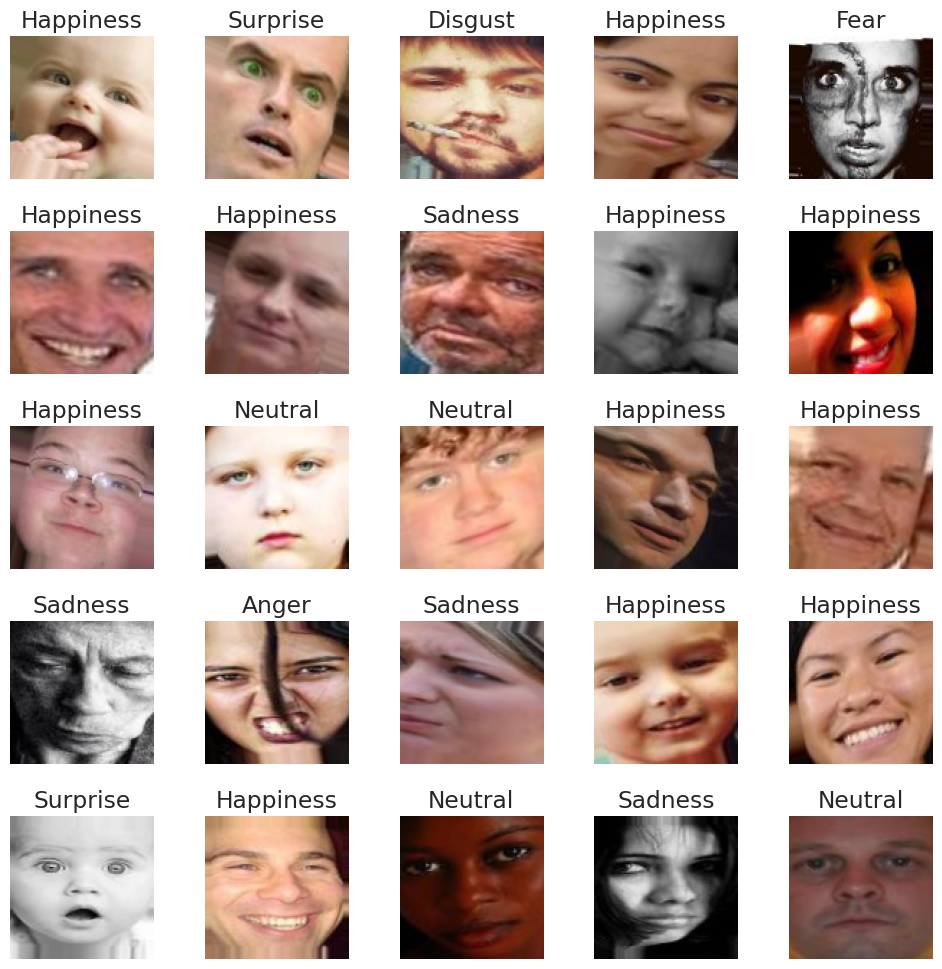

In [10]:
import matplotlib.pyplot as plt

# Képek és címkék betöltése a train_generatorból
images, labels = next(train_generator)
labels = np.array(labels).astype(int)


# Az osztályok neveinek lekérdezése
class_names = list(train_generator.class_indices.keys())

# Az előállított batch mérete
batch_size = len(labels)

# Képek és címkék megjelenítése
for i in range(batch_size):
    image = images[i]
    rgb_image = cv2.cvtColor(image * 255, cv2.COLOR_BGR2RGB)
    cv2_imshow(rgb_image)
    label = labels[i]
    print(label)

fig, axes = plt.subplots(5, 5, figsize=(10, 10))

a = 0
for i in range(5):
    for j in range(5):
        #rgb_image = cv2.cvtColor(images[i*5+j], cv2.COLOR_BGR2RGB)
        a+=1
        axes[i, j].imshow(images[i*5+j])
        axes[i,j].set_title(class_names[labels[i*5+j]])

        axes[i, j].axis('off')

plt.tight_layout()
plt.show()

## Háló struktúra

In [ ]:
from keras import Sequential, Input
from keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Dropout, Dense, Flatten, RandomFlip
from keras.layers.core import activation

input_shape_emotic = (100,100,3)

model = tf.keras.Sequential([  #Sequential: kezdeskent megadhatunk egy input_shapet, majd kesobb automatikusan hatarozzuk meg az alakjat
    RandomFlip(mode='horizontal'),
    Conv2D(256 , (3, 3) , activation='relu' , input_shape=input_shape_emotic),
    BatchNormalization(), #normalizálja az inputot ugy, hogy atlaga 0, szorasa 1 legyen, minden reteg fuggetlenul tud tanulni a tobbitol --- nem lesz overfitting!'''
    Dropout(0.2), #overfitting csökkentése - figyelmen kivul hagyunk egyes neuronokat, így nem fognak függeni egymástól'''
    Conv2D(256, (3, 3), activation='relu', input_shape=input_shape_emotic),
    BatchNormalization(),
    Dropout(0.2),
    Conv2D(128, (3, 3), activation='relu', input_shape=input_shape_emotic),
    BatchNormalization(),
    Dropout(0.2),
    Conv2D(64, (3, 3), activation='relu', input_shape=input_shape_emotic),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Dropout(0.2),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dropout(0.2),
    Dense(32, activation=tf.nn.relu),
    Dropout(0.2),
    BatchNormalization(),
    Dense(7, activation=tf.nn.softmax)
])



model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
input_shape = (None, 100, 100, 3)
model.build(input_shape)
print(model.summary())



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip (RandomFlip)    (None, 100, 100, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 98, 98, 256)       7168      
                                                                 
 batch_normalization (BatchN  (None, 98, 98, 256)      1024      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 98, 98, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 256)       590080    
                                                                 
 batch_normalization_1 (Batc  (None, 96, 96, 256)      1024      
 hNormalization)                                        

In [ ]:
from keras import Sequential, Input
from keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Dropout, Dense, Flatten, RandomFlip
#from keras.layers.core import activation

input_shape_emotic = (100,100,3)


model = tf.keras.Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape_emotic),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(7, activation='softmax')
])


model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
input_shape = (None, 100, 100, 3)
model.build(input_shape)
print(model.summary())


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 49, 49, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 47, 47, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 23, 23, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 21, 21, 64)        36928     
                                                                 
 flatten (Flatten)           (None, 28224)             0

## Transfer learning

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(100, 100, 3))

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(7, activation='softmax')(x)

head_model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

head_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
head_model.fit(train_generator, epochs=10, validation_data=val_generator)


Epoch 1/10
307/307 [==============================] - 50s 147ms/step - loss: 1.6601 - accuracy: 0.3807 - val_loss: 1.6286 - val_accuracy: 0.3919
Epoch 2/10
307/307 [==============================] - 43s 138ms/step - loss: 1.6297 - accuracy: 0.3906 - val_loss: 1.5963 - val_accuracy: 0.3902
Epoch 3/10
307/307 [==============================] - 44s 143ms/step - loss: 1.6111 - accuracy: 0.3900 - val_loss: 1.5913 - val_accuracy: 0.3910
Epoch 4/10
307/307 [==============================] - 44s 142ms/step - loss: 1.6107 - accuracy: 0.3893 - val_loss: 1.5877 - val_accuracy: 0.3894


KeyboardInterrupt: ignored

## Kiegészítő függvények

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

model_save_path = 'model.h5'

checkpointer = ModelCheckpoint(
    model_save_path,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=3,
    verbose=0,
    mode='auto',
    restore_best_weights=True
)

### Súlyozás

In [ ]:
class_names  = ['Anger','Disgust','Fear','Happiness','Neutral','Sadness','Surprise']
class_counts = {}

for class_name in class_names:
    class_directory = os.path.join(str(train_directory), str(class_name))
    file_count = len(os.listdir(class_directory))
    class_counts[class_name] = file_count

print(class_counts)

class_weights = {}
total_samples = sum(class_counts.values())
i = 0
for index, count in class_counts.items():
    class_weight = total_samples / (len(class_counts) * count)
    class_weights[i]= class_weight
    i = i+1

print(class_weights)

class_indices = test_generator.class_indices


{'Anger': 569, 'Disgust': 568, 'Fear': 219, 'Happiness': 3833, 'Neutral': 2048, 'Sadness': 1569, 'Surprise': 1010}
{0: 2.464474014561888, 1: 2.4688128772635816, 2: 6.403131115459883, 3: 0.36584547724646865, 4: 0.6847098214285714, 5: 0.8937448784485114, 6: 1.3884016973125883}


## Tanítás

In [ ]:
history = model.fit(train_generator, batch_size=32, epochs=100, shuffle=True,
                    class_weight=class_weights,
                    validation_data=val_generator,
                    callbacks=[checkpointer, early_stopping])

model.load_weights(model_save_path)

Epoch 1/100
307/307 [==============================] - ETA: 0s - loss: 1.9136 - accuracy: 0.1317
Epoch 1: val_loss improved from inf to 1.82941, saving model to model.h5
307/307 [==============================] - 45s 112ms/step - loss: 1.9136 - accuracy: 0.1317 - val_loss: 1.8294 - val_accuracy: 0.1556
Epoch 2/100
307/307 [==============================] - ETA: 0s - loss: 1.7882 - accuracy: 0.3247
Epoch 2: val_loss did not improve from 1.82941
307/307 [==============================] - 35s 113ms/step - loss: 1.7882 - accuracy: 0.3247 - val_loss: 1.9457 - val_accuracy: 0.2949
Epoch 3/100
307/307 [==============================] - ETA: 0s - loss: 1.6472 - accuracy: 0.4017
Epoch 3: val_loss improved from 1.82941 to 1.39176, saving model to model.h5
307/307 [==============================] - 34s 111ms/step - loss: 1.6472 - accuracy: 0.4017 - val_loss: 1.3918 - val_accuracy: 0.5043
Epoch 4/100
307/307 [==============================] - ETA: 0s - loss: 1.5058 - accuracy: 0.4566
Epoch 4: val_

In [ ]:
test_loss, test_accuracy = model.evaluate(test_generator)

print('Test Loss:', test_loss)
print('Test Accuracy:', test_accuracy)




96/96 [==============================] - 2s 20ms/step - loss: 0.9385 - accuracy: 0.6754
Test Loss: 0.9384840130805969
Test Accuracy: 0.6753585338592529


96/96 [==============================] - 2s 23ms/step
Tesztadat: Anger/test_0017_aligned.jpg, Predikció: 4, Valós címke: 0
Tesztadat: Anger/test_0027_aligned.jpg, Predikció: 0, Valós címke: 0
Tesztadat: Anger/test_0037_aligned.jpg, Predikció: 0, Valós címke: 0
Tesztadat: Anger/test_0042_aligned.jpg, Predikció: 6, Valós címke: 0
Tesztadat: Anger/test_0057_aligned.jpg, Predikció: 6, Valós címke: 0
Tesztadat: Anger/test_0091_aligned.jpg, Predikció: 4, Valós címke: 0
Tesztadat: Anger/test_0136_aligned.jpg, Predikció: 0, Valós címke: 0
Tesztadat: Anger/test_0185_aligned.jpg, Predikció: 6, Valós címke: 0
Tesztadat: Anger/test_0186_aligned.jpg, Predikció: 2, Valós címke: 0
Tesztadat: Anger/test_0190_aligned.jpg, Predikció: 0, Valós címke: 0
Tesztadat: Anger/test_0201_aligned.jpg, Predikció: 0, Valós címke: 0
Tesztadat: Anger/test_0215_aligned.jpg, Predikció: 0, Valós címke: 0
Tesztadat: Anger/test_0216_aligned.jpg, Predikció: 0, Valós címke: 0
Tesztadat: Anger/test_0225_aligned.jpg, Predikció

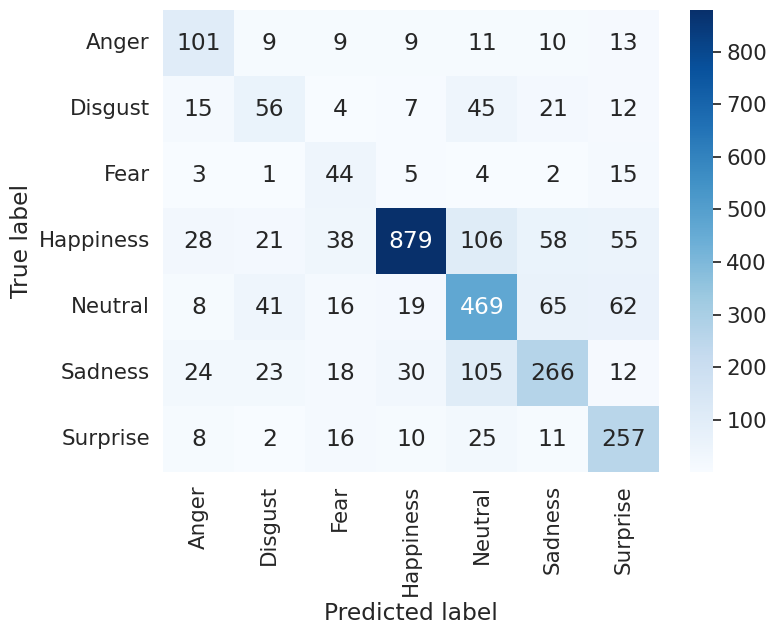

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns


np.set_printoptions(threshold=np.inf)  # Összes elem kiírása


# Előrejelzések létrehozása a tesztadatokon
y_pred = model.predict(test_generator)
y_pred = np.argmax(y_pred, axis=1)  # Az osztályindexek előrejelzéseinek meghatározása


# Valós címkék a tesztadatokhoz
y_true = test_generator.classes



# Azonosítók kinyerése a tesztadatokból
ids = test_generator.filenames

# Tesztadatok, predikciók és valós címkék kiíratása
for i in range(len(ids)):
    print(f"Tesztadat: {ids[i]}, Predikció: {y_pred[i]}, Valós címke: {y_true[i]}")

# Osztályok nevei és száma
class_names = list(test_generator.class_indices.keys())
num_classes = len(class_names)

# Konfúziós mátrix létrehozása
cm = confusion_matrix(y_true, y_pred)

# Konfúziós mátrix kiiratása
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

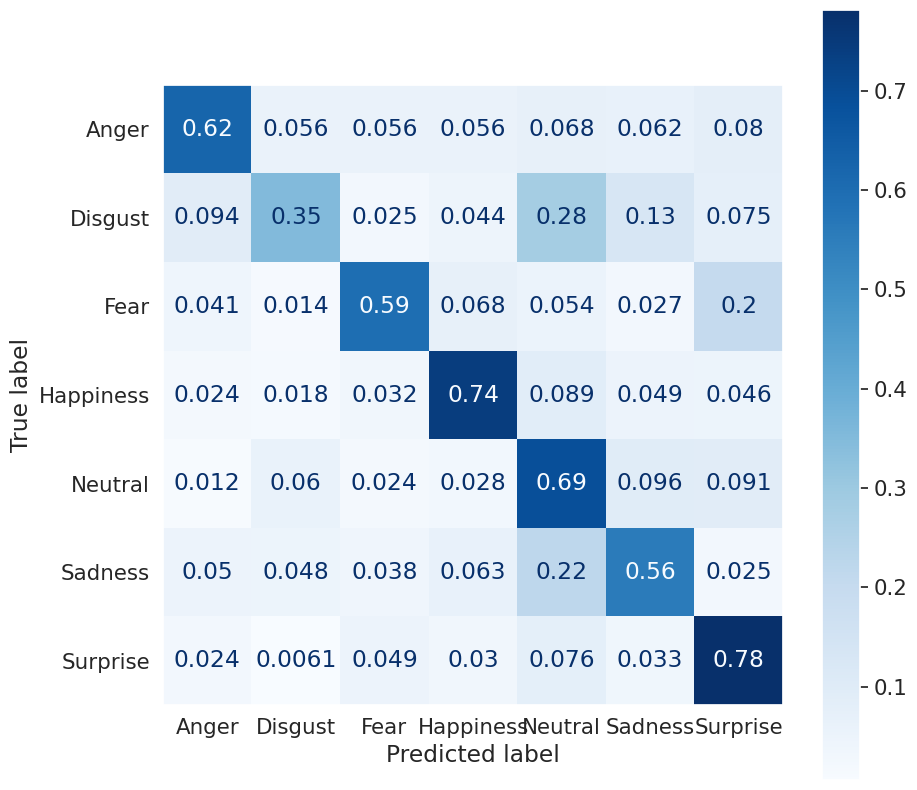

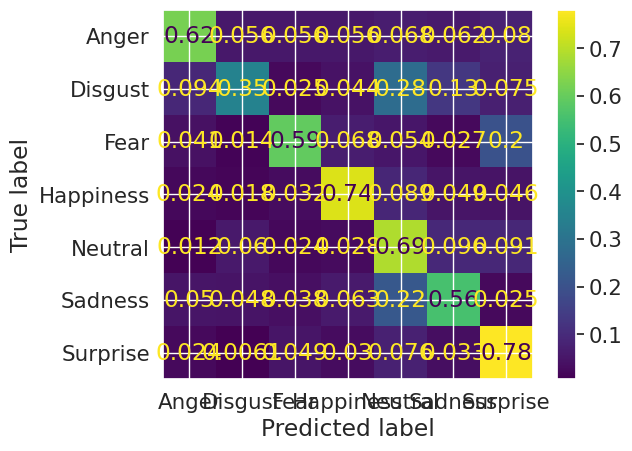

In [ ]:
import sklearn
fig, ax = plt.subplots(figsize=(10, 10))
ax.grid(False)
conf_matrix = sklearn.metrics.ConfusionMatrixDisplay.from_predictions(y_true, y_pred, display_labels=class_names, normalize='true')
conf_matrix.plot(ax=ax, cmap='Blues')


## Mediapipeos rész

In [11]:
!pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.5/33.5 MB 44.2 MB/s eta 0:00:00


In [12]:
import mediapipe as mp
mp_face_mesh = mp.solutions.face_mesh

# Load drawing_utils and drawing_styles
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

## Landmark pontok

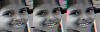

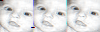

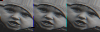

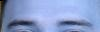

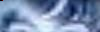

...

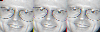

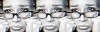

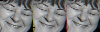

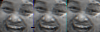

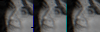

KeyboardInterrupt: ignored

In [ ]:
from google.colab.patches import cv2_imshow

# Run MediaPipe Face Mesh.
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    refine_landmarks=True,
    max_num_faces=2,
    min_detection_confidence=0.5) as face_mesh:

  for image, label in train_generator:
    # Convert the BGR image to RGB and process it with MediaPipe Face Mesh.
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    rgb_image = rgb_image.astype('uint8')  # C
    results = face_mesh.process(rgb_image)
    #print(rgb_image)
    cv2_imshow(rgb_image)


    # Draw face landmarks of each face.
    if not results.multi_face_landmarks:
      continue

    annotated_image = rgb_image.copy()
    for face_landmarks in results.multi_face_landmarks:
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_TESSELATION,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_tesselation_style())
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_CONTOURS,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_contours_style())
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_IRISES,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_iris_connections_style())
  cv2_imshow(annotated_image)


Saving test_0008_aligned.jpg to test_0008_aligned (1).jpg


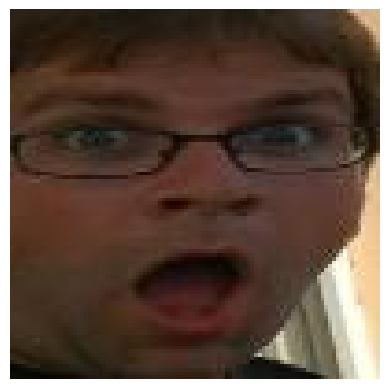

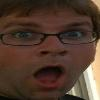

[[[ 43  34  19]
  [ 43  34  19]
  [ 44  34  22]
  ...
  [213 181 140]
  [214 183 139]
  [210 179 135]]

 [[ 43  34  19]
  [ 44  35  20]
  [ 44  34  22]
  ...
  [210 178 137]
  [214 183 139]
  [214 183 139]]

 [[ 44  34  22]
  [ 44  34  22]
  [ 43  33  21]
  ...
  [210 177 134]
  [209 176 133]
  [214 181 138]]

 ...

 [[  6   7   0]
  [  7   8   0]
  [  8   9   1]
  ...
  [255 253 226]
  [250 243 217]
  [236 229 201]]

 [[ 10  11   5]
  [  9  10   4]
  [  9  10   4]
  ...
  [255 255 228]
  [253 246 220]
  [240 233 205]]

 [[ 11  12   6]
  [ 11  12   6]
  [ 10  11   5]
  ...
  [255 255 228]
  [254 247 221]
  [243 236 208]]]


In [ ]:
from google.colab import files
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf


# Kép feltöltése
uploaded = files.upload()

# Az első feltöltött kép kiválasztása
image_name = list(uploaded.keys())[0]
image_path = image_name

# Kép beolvasása
image_v = cv2.imread(image_path)
image_v = cv2.cvtColor(image_v, cv2.COLOR_BGR2RGB)

# Betöltjük a képet a TensorFlow segítségével
#image_v = tf.keras.preprocessing.image.load_img("/content/boldogari.jpg", target_size=(100, 100))

# Átalakítjuk a képet numpy tömbbé
image_array = tf.keras.preprocessing.image.img_to_array(image_v)

# Újraformázzuk a tömböt az elvárt bemeneti alak szerint (None, 100, 100, 3)
input_image = image_array.reshape((1, 100, 100, 3))

# Kép megjelenítése
plt.imshow(image_v)
plt.axis('off')
plt.show()


cv2_imshow(cv2.cvtColor(image_v, cv2.COLOR_RGB2BGR))
print(image_v)







In [38]:
# Először is meg kell találni a szájhoz kapcsolódó landmark pontokat
mouth_landmarks = []
eyebrow_landmarks = []
eyes_landmarks = []

lipsUpperOuter = [ 61, 185, 40, 39, 37, 0, 267, 269, 270, 409, 291]
lipsLowerOuter = [146, 91, 181, 84, 17, 314, 405, 321, 375, 291]
lips = lipsLowerOuter + lipsUpperOuter


rightEyebrowUpper =  [156, 70, 63, 105, 66, 107, 55, 193]
rightEyebrowLower =  [35, 124, 46, 53, 52, 65]
leftEyebrowUpper = [383, 300, 293, 334, 296, 336, 285, 417]
leftEyebrowLower = [265, 353, 276, 283, 282, 295]
eyebrows = rightEyebrowLower + rightEyebrowUpper + leftEyebrowLower + leftEyebrowUpper

rightEyeUpper0 = [246, 161, 160, 159, 158, 157, 173]
rightEyeLower0 = [33, 7, 163, 144, 145, 153, 154, 155, 133]
rightEyeUpper1 = [247, 30, 29, 27, 28, 56, 190]
rightEyeLower1 = [130, 25, 110, 24, 23, 22, 26, 112, 243]
rightEyeUpper2 = [113, 225, 224, 223, 222, 221, 189]
rightEyeLower2 = [226, 31, 228, 229, 230, 231, 232, 233, 244]
rightEyeLower3 = [143, 111, 117, 118, 119, 120, 121, 128, 245]

leftEyeUpper0 = [466, 388, 387, 386, 385, 384, 398]
leftEyeLower0 = [263, 249, 390, 373, 374, 380, 381, 382, 362]
leftEyeUpper1 = [467, 260, 259, 257, 258, 286, 414]
leftEyeLower1 = [359, 255, 339, 254, 253, 252, 256, 341, 463]
leftEyeUpper2 = [342, 445, 444, 443, 442, 441, 413]
leftEyeLower2 = [446, 261, 448, 449, 450, 451, 452, 453, 464]
leftEyeLower3 = [372, 340, 346, 347, 348, 349, 350, 357, 465]

eyes = rightEyeUpper0 +rightEyeLower0 +rightEyeUpper1 +rightEyeLower1 +rightEyeUpper2 +rightEyeLower2 +rightEyeLower3 + leftEyeUpper0 +leftEyeLower0 +leftEyeUpper1 +leftEyeLower1 +leftEyeUpper2 +leftEyeLower2 +leftEyeLower3



Egy képre alkalmazva a landmark

0


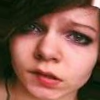

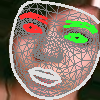

1


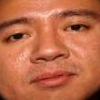

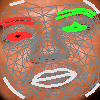

2


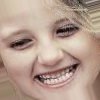

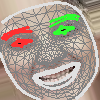

3


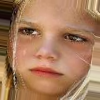

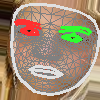

4


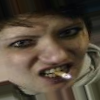

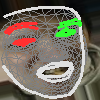

5


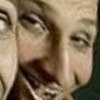

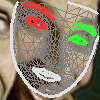

6


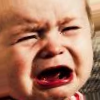

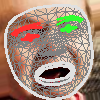

7


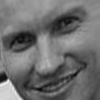

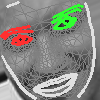

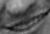

8


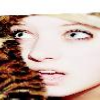

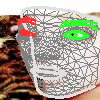

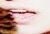

9


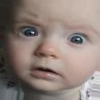

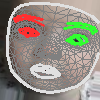

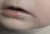

10


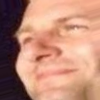

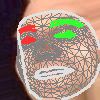

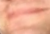

11


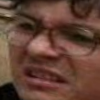

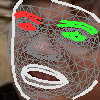

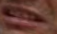

12


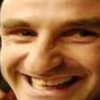

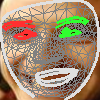

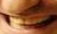

13


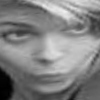

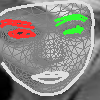

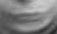

14


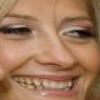

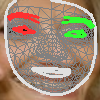

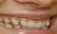

15


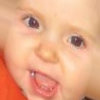

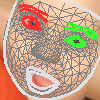

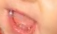

16


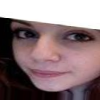

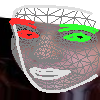

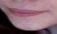

17


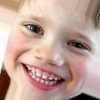

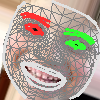

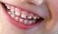

18


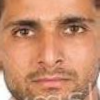

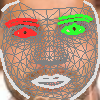

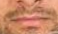

19


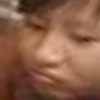

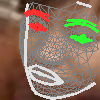

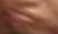

20


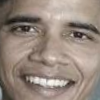

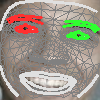

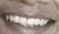

21


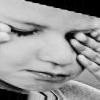

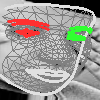

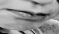

In [52]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

# Betöltjük az első batch képeit a train_generator segítségével
batch = next(train_generator)
images = batch[0]  # A képek a batch-en belül az első elem

landmark_images = []
szam = 0

for image in images:
  image = cv2.cvtColor(image*255, cv2.COLOR_BGR2RGB)
    # Válaszd ki az index alapján vagy más módon
  # Run MediaPipe Face Mesh.
  with mp_face_mesh.FaceMesh(
      static_image_mode=True,
      refine_landmarks=True,
      max_num_faces=2,
      min_detection_confidence=0.5) as face_mesh:

    # Convert the BGR image to RGB and process it with MediaPipe Face Mesh.
    image_uint8 = image.astype(np.uint8)
    results = face_mesh.process(image_uint8)
    # Draw face landmarks of each face.
    annotated_image = image.copy()
    landmarks = []
    if results.multi_face_landmarks:
      landmark_images.append(image)
      for face_landmarks in results.multi_face_landmarks:
        mp_drawing.draw_landmarks(
            image=annotated_image,
            landmark_list=face_landmarks,
            connections=mp_face_mesh.FACEMESH_TESSELATION,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles
            .get_default_face_mesh_tesselation_style())
        mp_drawing.draw_landmarks(
            image=annotated_image,
            landmark_list=face_landmarks,
            connections=mp_face_mesh.FACEMESH_CONTOURS,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles
            .get_default_face_mesh_contours_style())
        mp_drawing.draw_landmarks(
            image=annotated_image,
            landmark_list=face_landmarks,
            connections=mp_face_mesh.FACEMESH_IRISES,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles
            .get_default_face_mesh_iris_connections_style())
        # Elmentjük a landmark pontokat
        height, width, _ = image.shape
        for landmark in face_landmarks.landmark:
            x = int(landmark.x * width)
            y = int(landmark.y * height)
            landmarks.append((x, y))
        for i, landmark in enumerate(face_landmarks.landmark):
        # A landmark pontok indexei alapján válaszd ki az ajkakhoz tartozó pontokat
            if i in lips:
                #print(i)

                x = int(landmark.x * width)
                y = int(landmark.y * height)
                mouth_landmarks.append((x, y))
            elif i in eyebrows:
                x = int(landmark.x * width)
                y = int(landmark.y * height)
                eyebrow_landmarks.append((x, y))
            elif i in eyes:
                x = int(landmark.x * width)
                y = int(landmark.y * height)
                eyes_landmarks.append((x, y))
        # Ha vannak ajkakhoz tartozó landmark pontok, vágjuk ki a szájat
        # Határozzuk meg az ajkakhoz tartozó terület határait
        x_min = min(mouth_landmarks, key=lambda p: p[0])[0]
        x_max = max(mouth_landmarks, key=lambda p: p[0])[0]
        y_min = min(mouth_landmarks, key=lambda p: p[1])[1]
        y_max = max(mouth_landmarks, key=lambda p: p[1])[1]

        # Kivágjuk az ajkak területét
        mouth_region = image[y_min:y_max, x_min:x_max]
        print(szam)
        szam+=1
        # Megjelenítjük az ajkak területét
        cv2_imshow(image)
        cv2_imshow(annotated_image)
        cv2_imshow(mouth_region)


  later_image = image
  ''' print(landmarks)
  cv2_imshow(later_image)
  cv2_imshow(annotated_image)'''


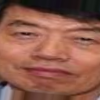

0


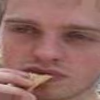

1


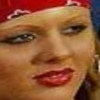

2


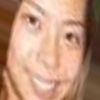

3


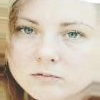

4


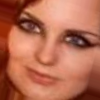

5


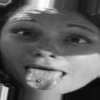

6


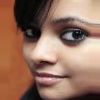

7


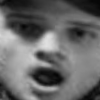

8


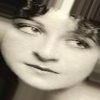

9


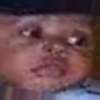

10


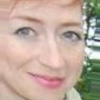

11


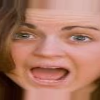

12


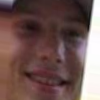

13


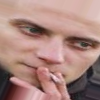

14


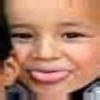

15


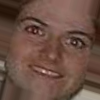

16


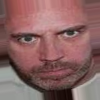

17


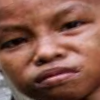

18


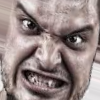

19


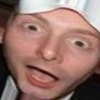

20


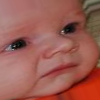

21


In [50]:
# Megjelenítés (opcionális)
for i, landmark_image in enumerate(landmark_images):
    cv2_imshow(landmark_image)
    print(i)

In [51]:
# Először is meg kell találni a szájhoz kapcsolódó landmark pontokat
mouth_landmarks = []
eyebrow_landmarks = []
eyes_landmarks = []

lipsUpperOuter = [ 61, 185, 40, 39, 37, 0, 267, 269, 270, 409, 291]
lipsLowerOuter = [146, 91, 181, 84, 17, 314, 405, 321, 375, 291]
lips = lipsLowerOuter + lipsUpperOuter

rightEyebrowUpper =  [156, 70, 63, 105, 66, 107, 55, 193]
rightEyebrowLower =  [35, 124, 46, 53, 52, 65]
leftEyebrowUpper = [383, 300, 293, 334, 296, 336, 285, 417]
leftEyebrowLower = [265, 353, 276, 283, 282, 295]
eyebrows = rightEyebrowLower + rightEyebrowUpper + leftEyebrowLower + leftEyebrowUpper

rightEyeUpper0 = [246, 161, 160, 159, 158, 157, 173]
rightEyeLower0 = [33, 7, 163, 144, 145, 153, 154, 155, 133]
rightEyeUpper1 = [247, 30, 29, 27, 28, 56, 190]
rightEyeLower1 = [130, 25, 110, 24, 23, 22, 26, 112, 243]
rightEyeUpper2 = [113, 225, 224, 223, 222, 221, 189]
rightEyeLower2 = [226, 31, 228, 229, 230, 231, 232, 233, 244]
rightEyeLower3 = [143, 111, 117, 118, 119, 120, 121, 128, 245]

leftEyeUpper0 = [466, 388, 387, 386, 385, 384, 398]
leftEyeLower0 = [263, 249, 390, 373, 374, 380, 381, 382, 362]
leftEyeUpper1 = [467, 260, 259, 257, 258, 286, 414]
leftEyeLower1 = [359, 255, 339, 254, 253, 252, 256, 341, 463]
leftEyeUpper2 = [342, 445, 444, 443, 442, 441, 413]
leftEyeLower2 = [446, 261, 448, 449, 450, 451, 452, 453, 464]
leftEyeLower3 = [372, 340, 346, 347, 348, 349, 350, 357, 465]

eyes = rightEyeUpper0 +rightEyeLower0 +rightEyeUpper1 +rightEyeLower1 +rightEyeUpper2 +rightEyeLower2 +rightEyeLower3 + leftEyeUpper0 +leftEyeLower0 +leftEyeUpper1 +leftEyeLower1 +leftEyeUpper2 +leftEyeLower2 +leftEyeLower3


for image in landmark_images:
    for i, landmark in enumerate(face_landmarks.landmark):
        # A landmark pontok indexei alapján válaszd ki az ajkakhoz tartozó pontokat
        if i in lips:
            print(i)
            x = int(landmark.x * width)
            y = int(landmark.y * height)
            mouth_landmarks.append((x, y))
        elif i in eyebrows:
            x = int(landmark.x * width)
            y = int(landmark.y * height)
            eyebrow_landmarks.append((x, y))
        elif i in eyes:
            x = int(landmark.x * width)
            y = int(landmark.y * height)
            eyes_landmarks.append((x, y))
    # Ha vannak ajkakhoz tartozó landmark pontok, vágjuk ki a szájat
    # Határozzuk meg az ajkakhoz tartozó terület határait
    x_min = min(mouth_landmarks, key=lambda p: p[0])[0]
    x_max = max(mouth_landmarks, key=lambda p: p[0])[0]
    y_min = min(mouth_landmarks, key=lambda p: p[1])[1]
    y_max = max(mouth_landmarks, key=lambda p: p[1])[1]

    # Kivágjuk az ajkak területét
    mouth_region = later_image[y_min:y_max, x_min:x_max]

    # Megjelenítjük az ajkak területét
    cv2_imshow(mouth_region)

0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


0
17
37
39
40
61
84
91
146
181
185
267
269
270
291
314
321
375
405
409


###Száj kivágása

In [19]:
# Ha vannak ajkakhoz tartozó landmark pontok, vágjuk ki a szájat
# Határozzuk meg az ajkakhoz tartozó terület határait
x_min = min(mouth_landmarks, key=lambda p: p[0])[0]
x_max = max(mouth_landmarks, key=lambda p: p[0])[0]
y_min = min(mouth_landmarks, key=lambda p: p[1])[1]
y_max = max(mouth_landmarks, key=lambda p: p[1])[1]

# Kivágjuk az ajkak területét
mouth_region = later_image[y_min:y_max, x_min:x_max]

# Megjelenítjük az ajkak területét
cv2_imshow(mouth_region)

### Szemöldök kivágása

In [24]:
import cv2
from google.colab.patches import cv2_imshow


x_min = min(eyebrow_landmarks, key=lambda p: p[0])[0]
x_max = max(eyebrow_landmarks, key=lambda p: p[0])[0]
y_min = min(eyebrow_landmarks, key=lambda p: p[1])[1]
y_max = max(eyebrow_landmarks, key=lambda p: p[1])[1]

# Kivágjuk az ajkak területét
eyebrow_region = later_image[y_min:y_max, x_min:x_max]

# Megjelenítjük az ajkak területét
cv2_imshow(eyebrow_region)

error: ignored

### Szemek kivágása

In [21]:
# Ha vannak ajkakhoz tartozó landmark pontok, vágjuk ki a szájat
# Határozzuk meg az ajkakhoz tartozó terület határait
x_min = min(eyes_landmarks, key=lambda p: p[0])[0]
x_max = max(eyes_landmarks, key=lambda p: p[0])[0]
y_min = min(eyes_landmarks, key=lambda p: p[1])[1]
y_max = max(eyes_landmarks, key=lambda p: p[1])[1]

# Kivágjuk az ajkak területét
eyes_region = later_image[y_min:y_max, x_min:x_max]

# Megjelenítjük az ajkak területét
cv2_imshow(eyes_region)

error: ignored

In [ ]:
!pip install lime scikit-image

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=91f589e1b69b146d4993b611e017d5afcf1a52bdbc22fc6ab9a3bfc300c548f5
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import lime
from lime import lime_image
from skimage.segmentation import slic
import numpy as np


In [ ]:
explainer = lime_image.LimeImageExplainer()


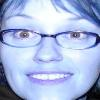

3.0


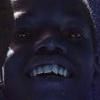

3.0


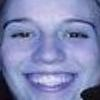

3.0


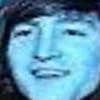

3.0


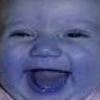

3.0


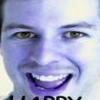

3.0


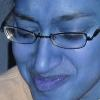

3.0


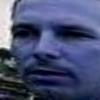

3.0


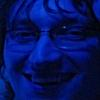

3.0


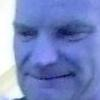

3.0


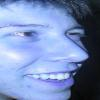

3.0


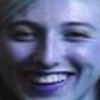

3.0


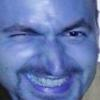

3.0


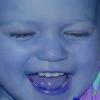

3.0


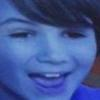

3.0


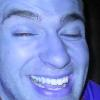

3.0


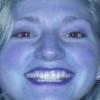

3.0


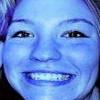

3.0


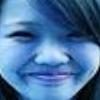

3.0


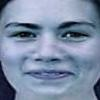

3.0


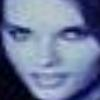

3.0


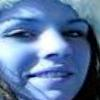

3.0


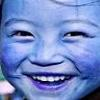

3.0


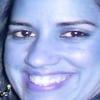

3.0


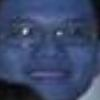

3.0


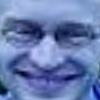

3.0


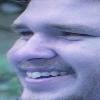

3.0


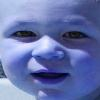

3.0


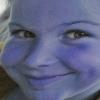

3.0


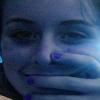

3.0


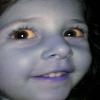

3.0


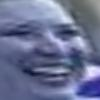

3.0


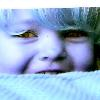

3.0


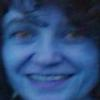

3.0


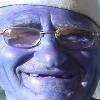

3.0


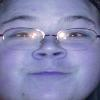

3.0


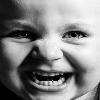

3.0


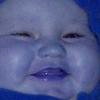

3.0


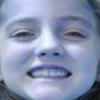

3.0


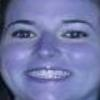

3.0


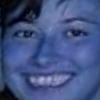

3.0


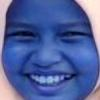

3.0


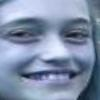

3.0


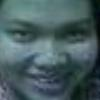

3.0


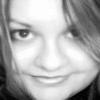

3.0


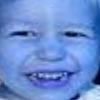

3.0


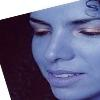

3.0


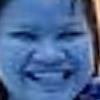

3.0


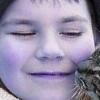

3.0


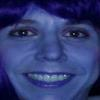

3.0


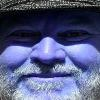

3.0


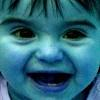

3.0


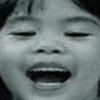

3.0


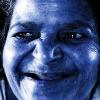

3.0


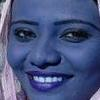

3.0


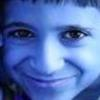

3.0


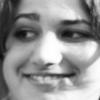

3.0


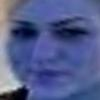

3.0


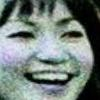

3.0


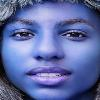

3.0


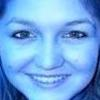

3.0


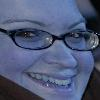

3.0


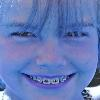

3.0


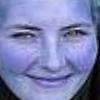

3.0


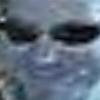

3.0


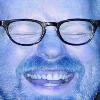

3.0


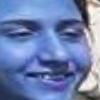

3.0


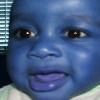

3.0


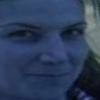

3.0


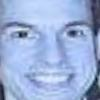

3.0


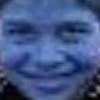

3.0


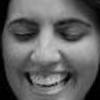

3.0


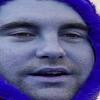

3.0


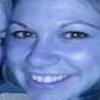

3.0


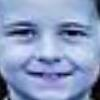

3.0


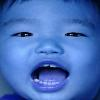

3.0


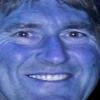

3.0


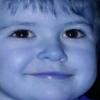

3.0


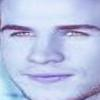

3.0


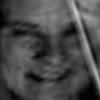

3.0


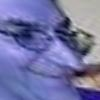

3.0


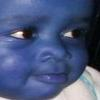

3.0


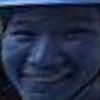

3.0


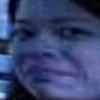

3.0


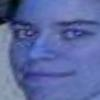

3.0


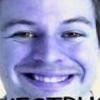

3.0


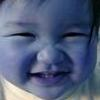

3.0


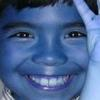

3.0


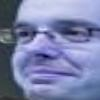

3.0


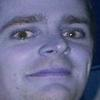

3.0


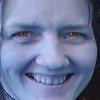

3.0


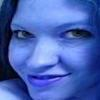

3.0


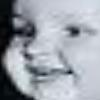

3.0


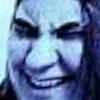

3.0


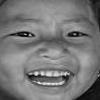

3.0


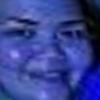

3.0


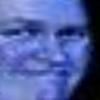

3.0


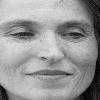

3.0


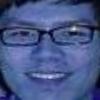

3.0


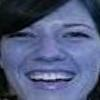

3.0


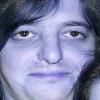

3.0


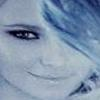

3.0


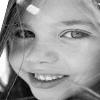

3.0


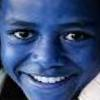

3.0


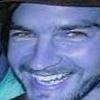

3.0


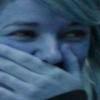

3.0


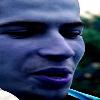

3.0


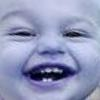

3.0


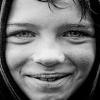

3.0


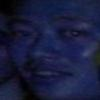

3.0


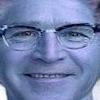

3.0


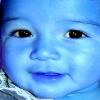

3.0


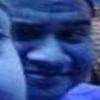

3.0


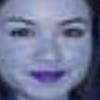

3.0


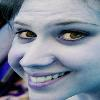

3.0


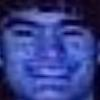

3.0


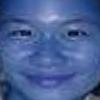

3.0


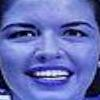

3.0


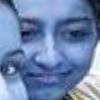

3.0


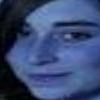

3.0


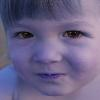

3.0


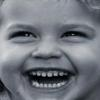

3.0


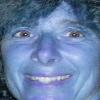

3.0


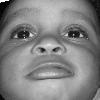

3.0


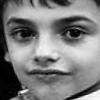

3.0


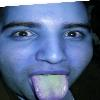

3.0


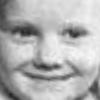

3.0


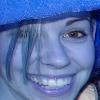

3.0
128


In [ ]:
import numpy as np
import lime
from lime import lime_image
from skimage.segmentation import slic
from google.colab.patches import cv2_imshow
import cv2
import tensorflow as tf

# Képek és címkék betöltése a train_generatorból

happy_pictures = []
z=0

for a in range(10):
  images, labels = next(val_generator)
  for i in range(32):
    if labels[i]==3.0:
      z+=1
      happy_pictures.append(images[i])
      cv2_imshow(images[i]*255)
      print(labels[i])
print(z)

In [ ]:
ari_pictures = []
ari_pictures.append(image_v)

In [ ]:
cv2_imshow(image_v)
plt.imshow(ari_pictures[0])
plt.axis('off')  # Tengelyek kikapcsolása
plt.show()

AttributeError: ignored

## Magyarázó modell + maszk

0


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


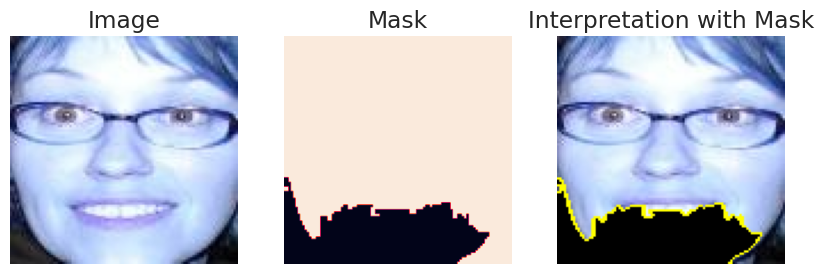

1


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


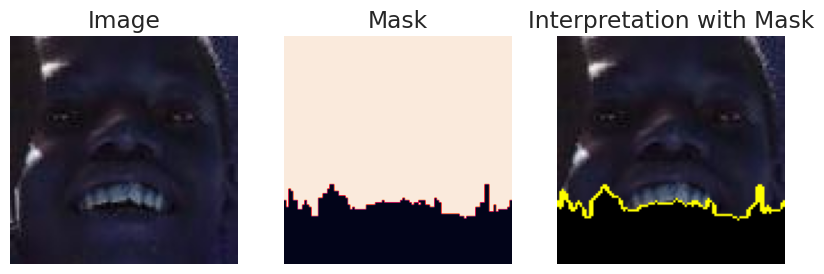

2


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


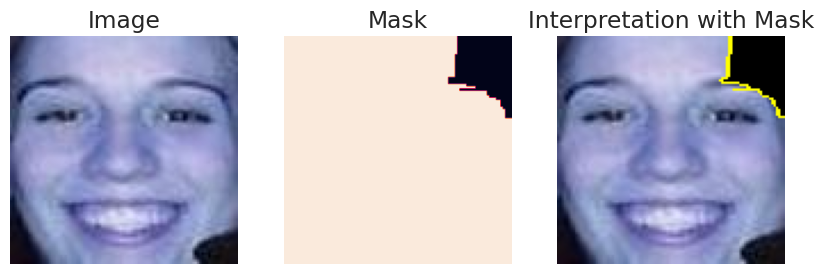

3


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


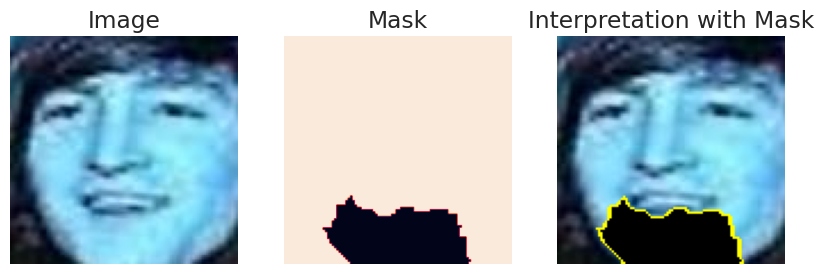

4


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


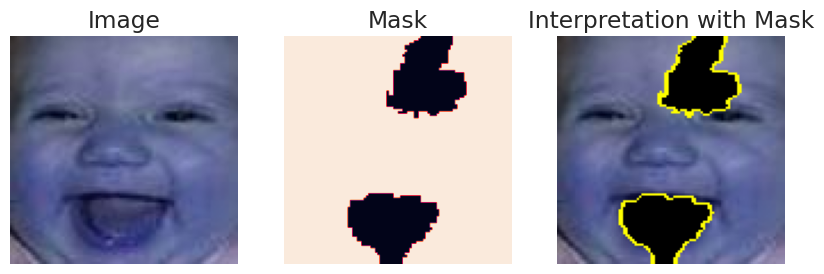

5


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


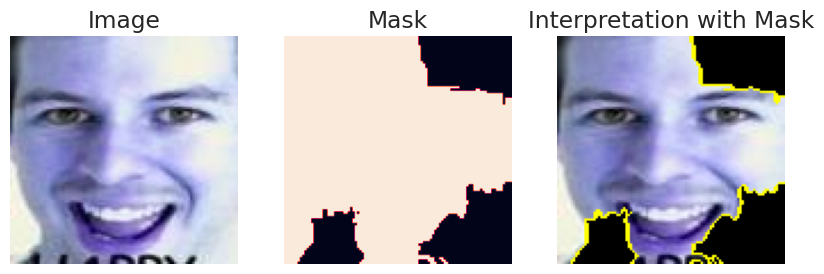

6


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


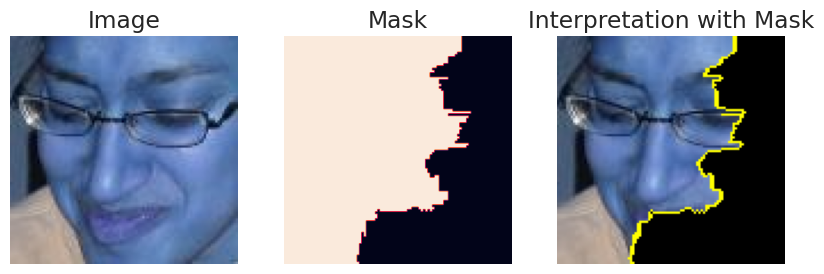

7


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


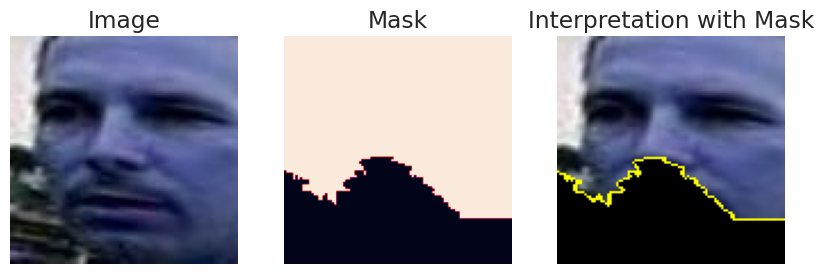

8


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


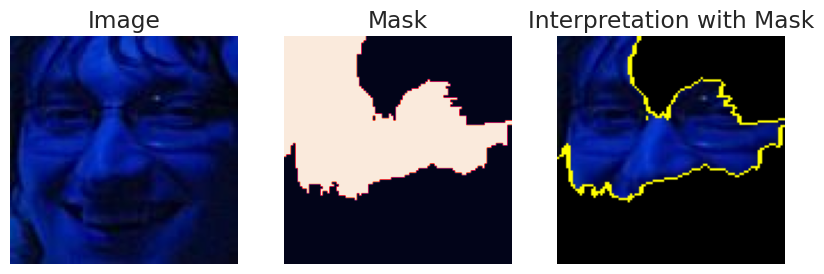

9


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


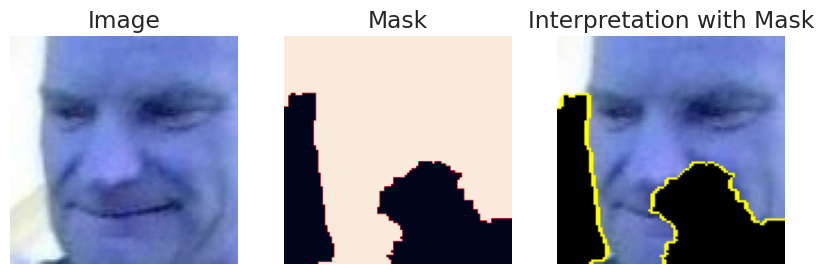

10


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


KeyboardInterrupt: ignored

In [ ]:
import numpy as np
import lime
from lime import lime_image
from skimage.segmentation import slic
from google.colab.patches import cv2_imshow
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries


# Előre betanított modell vagy saját modell inicializálása
model = tf.keras.Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape_emotic),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(7, activation='softmax')
])


# LIME explainer inicializálása
explainer = lime_image.LimeImageExplainer()

# Az előre betanított modell predikció függvénye
def predict_fn(images):
    # Implementáld a kép predikcióját az előre betanított modell segítségével
    predictions = model.predict(images)
    return predictions


happy_pictures = [np.array(image) for image in happy_pictures]

masks =[]

a = len(happy_pictures)


for i in range(a):
  print(i)
  image = cv2.cvtColor(happy_pictures[i], cv2.COLOR_BGR2RGB)

  segments = slic(image)
  explanation = explainer.explain_instance(image, predict_fn, top_labels=1, hide_color=0, num_samples=1000)
  # Határozd meg az interpretációkat a képhez
  image_interpretation = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=100, hide_rest=True)

  # A visszatérített értékek között megtalálod az interpretáció képet és a maszkot
  interpret_image, mask = image_interpretation
  masks.append(mask)

  # Megjelenítheted az interpretáció képet és a maszkot
  import matplotlib.pyplot as plt

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 5))
  ax1.imshow(image)
  ax1.axis('off')
  ax1.set_title('Image')

  ax2.imshow(mask)
  ax2.axis('off')
  ax2.set_title('Mask')

  # Interpretáció képének megjelenítése
  ax3.imshow(mark_boundaries(interpret_image, mask))
  ax3.axis('off')
  ax3.set_title('Interpretation with Mask')


  plt.show()






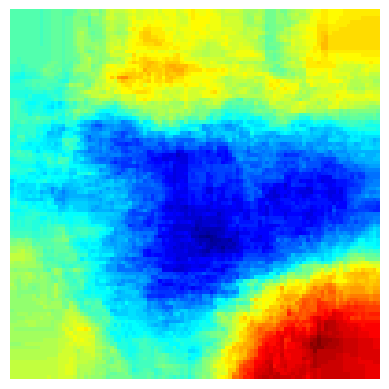

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Maszkok előkészítése

# Maszkok összegezése
aggregated_mask = np.sum(masks, axis=0)

# Normalizálás a [0, 1] tartományba
normalized_mask = (aggregated_mask - np.min(aggregated_mask)) / (np.max(aggregated_mask) - np.min(aggregated_mask))

# Heatmap létrehozása
heatmap = cv2.applyColorMap(np.uint8(255 * normalized_mask), cv2.COLORMAP_JET)

# Heatmap megjelenítése
plt.imshow(heatmap)
plt.axis('off')
plt.show()


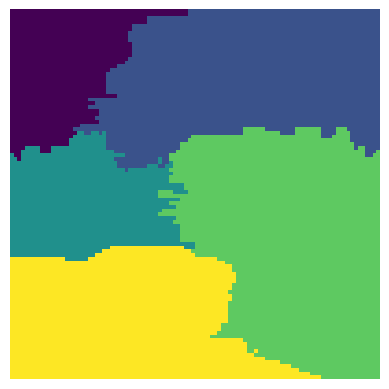

In [ ]:
plt.imshow(explanation.segments)
plt.axis('off')
plt.show()

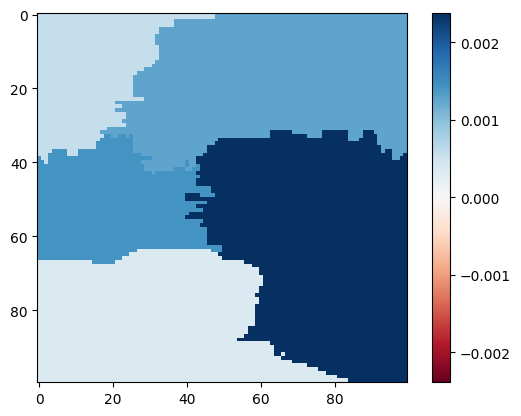

In [ ]:
def explanation_heatmap(exp, exp_class):
    '''
    Using heat-map to highlight the importance of each super-pixel for the model prediction
    '''
    dict_heatmap = dict(exp.local_exp[exp_class])
    heatmap = np.vectorize(dict_heatmap.get)(exp.segments)
    plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
    plt.colorbar()
    plt.show()

explanation_heatmap(explanation, explanation.top_labels[0])

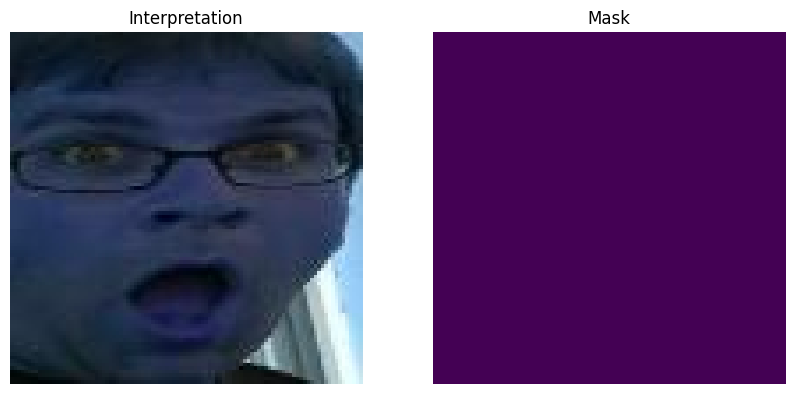

In [ ]:
# Határozd meg az interpretációkat a képhez
image_interpretation = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10, hide_rest=False)

# A visszatérített értékek között megtalálod az interpretáció képet és a maszkot
interpret_image, mask = image_interpretation

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(interpret_image)
ax1.axis('off')
ax1.set_title('Interpretation')

ax2.imshow(mask)
ax2.axis('off')
ax2.set_title('Mask')

plt.show()


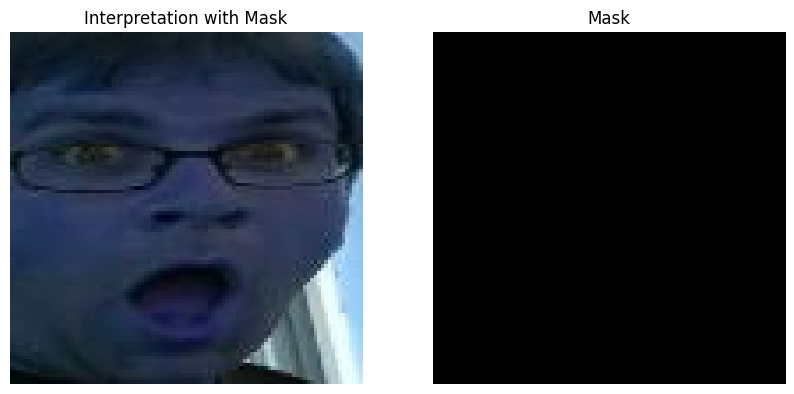

In [ ]:
from skimage.segmentation import mark_boundaries

# Interpretáció képének és maszkjának megjelenítése
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Interpretáció képének megjelenítése
ax1.imshow(mark_boundaries(interpret_image, mask))
ax1.axis('off')
ax1.set_title('Interpretation with Mask')

# Maszk megjelenítése
ax2.imshow(mask, cmap='gray')
ax2.axis('off')
ax2.set_title('Mask')

plt.show()
